# Korteweg–de Vries Equation
$
u_t + 6uu_x + u_{xxx} = 0
$

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from utils_0 import *
import scipy.io as sio

In [2]:
data = sio.loadmat('DATA/kdv.mat')
U = np.real(data['usol'])
x = data['x'][0]
t = data['t'][:,0]
n,m = U.shape 
dt = t[1]-t[0]
dx = x[1]-x[0]

/tmp/ipykernel_76730/625108071.py:3: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


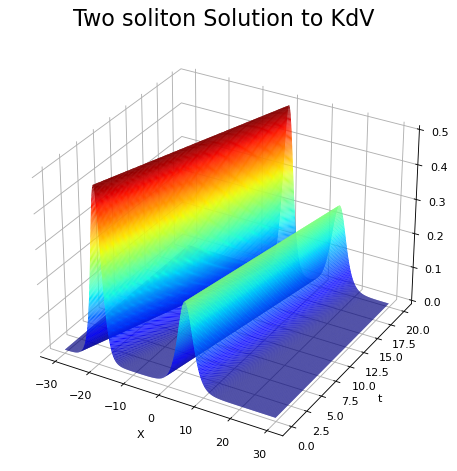

In [3]:
# plotting U field as a Surface
fig = plt.figure(figsize=(11, 7), dpi=80)
ax = fig.gca(projection='3d')
X, Y = np.meshgrid(x, t)
ax.plot_surface(X, Y, U.T, cmap='jet', rstride=1, cstride=1)
plt.title('Two soliton Solution to KdV', fontsize = 20)
plt.xlabel('X')
plt.ylabel('t');

# First remove fill
ax.xaxis.pane.fill = False
ax.yaxis.pane.fill = False
ax.zaxis.pane.fill = False

# Now set color to white
ax.xaxis.pane.set_edgecolor('w')
ax.yaxis.pane.set_edgecolor('w')
ax.zaxis.pane.set_edgecolor('w')

# get rid of the grid as well:
ax.grid(True)


In [4]:
Ut, R, rhs_des = build_linear_system(U, dt, dx, D=6, P=6, time_diff = 'FD', space_diff = 'FD')
['1']+rhs_des[1:]

['1',
 'u',
 'u^2',
 'u^3',
 'u^4',
 'u^5',
 'u^6',
 'u_{x}',
 'uu_{x}',
 'u^2u_{x}',
 'u^3u_{x}',
 'u^4u_{x}',
 'u^5u_{x}',
 'u^6u_{x}',
 'u_{xx}',
 'uu_{xx}',
 'u^2u_{xx}',
 'u^3u_{xx}',
 'u^4u_{xx}',
 'u^5u_{xx}',
 'u^6u_{xx}',
 'u_{xxx}',
 'uu_{xxx}',
 'u^2u_{xxx}',
 'u^3u_{xxx}',
 'u^4u_{xxx}',
 'u^5u_{xxx}',
 'u^6u_{xxx}',
 'u_{xxxx}',
 'uu_{xxxx}',
 'u^2u_{xxxx}',
 'u^3u_{xxxx}',
 'u^4u_{xxxx}',
 'u^5u_{xxxx}',
 'u^6u_{xxxx}',
 'u_{xxxxx}',
 'uu_{xxxxx}',
 'u^2u_{xxxxx}',
 'u^3u_{xxxxx}',
 'u^4u_{xxxxx}',
 'u^5u_{xxxxx}',
 'u^6u_{xxxxx}',
 'u_{xxxxxx}',
 'uu_{xxxxxx}',
 'u^2u_{xxxxxx}',
 'u^3u_{xxxxxx}',
 'u^4u_{xxxxxx}',
 'u^5u_{xxxxxx}',
 'u^6u_{xxxxxx}']

### FIND-SINDy

In [5]:
w = TrainSTRidge(R,Ut,10**-4,5)
print("PDE derived using STRidge")
print_pde(w, rhs_des)

PDE derived using STRidge
u_t = (-5.955399 +0.000000i)uu_{x}
    + (-0.987754 +0.000000i)u_{xxx}
   


In [6]:
True_theta = np.zeros(49)
True_theta[8] = -6
True_theta[21] = -1

In [7]:
print('FIND-SINDy L2 (0% noise)  :',np.linalg.norm(True_theta - w.reshape(-1))/np.linalg.norm(True_theta) )

FIND-SINDy L2 (0% noise)  : 0.007603644218232875


### SINDy

In [8]:
dxdt = np.column_stack(( Ut ))
lam = 1
Xi = sindy(lam,R,dxdt)
print_pde(Xi, rhs_des)

u_t = (-9.039529 +0.000000i)uu_{x}
    + (58.673216 +0.000000i)u^2u_{x}
    + (-357.102673 +0.000000i)u^3u_{x}
    + (716.608199 +0.000000i)u^4u_{x}
    + (-64.258199 +0.000000i)u^5u_{x}
    + (-563.051078 +0.000000i)u^6u_{x}
    + (-39.278438 +0.000000i)uu_{xxx}
    + (532.521735 +0.000000i)u^2u_{xxx}
    + (-3328.976257 +0.000000i)u^3u_{xxx}
    + (10297.988320 +0.000000i)u^4u_{xxx}
    + (-15262.253765 +0.000000i)u^5u_{xxx}
    + (8720.362075 +0.000000i)u^6u_{xxx}
    + (-1.899553 +0.000000i)u^2u_{xxxxx}
    + (19.336846 +0.000000i)u^3u_{xxxxx}
    + (-76.123011 +0.000000i)u^4u_{xxxxx}
    + (133.320275 +0.000000i)u^5u_{xxxxx}
    + (-86.345161 +0.000000i)u^6u_{xxxxx}
   


In [9]:
print('SINDy L2 (0% noise)  :',np.linalg.norm(True_theta - Xi.reshape(-1))/np.linalg.norm(True_theta) )

SINDy L2 (0% noise)  : 3398.7037804952583


### Variational Bayes

In [10]:
tol = 0.00001
pip = 0.9
verbosity = True
initz0 = initialization(w)
xdts = np.reshape(Ut, -1)
DS = Variational_Bayes_code(R, xdts, initz0, tol, pip, verbosity)
print('zmean  ',  DS['zmean'])
print('model_Index  ',DS['modelIdx'])
print('Wsel  ', DS['Wsel'])
print('Wcov  ', DS['Wcov'])

/home/user/Desktop/Colaborations/Yogesh and Kalpesh/[Kalpesh]Bayes_PDE_discovery/Github/utils_0.py:172: RuntimeWarning: overflow encountered in exp
  expitC = 1./(1 + np.exp(-C))
/home/user/Desktop/Colaborations/Yogesh and Kalpesh/[Kalpesh]Bayes_PDE_discovery/Github/utils_0.py:144: RuntimeWarning: divide by zero encountered in log
  + np.nansum(zm*(np.log(p0) - np.log(zm)))
/home/user/Desktop/Colaborations/Yogesh and Kalpesh/[Kalpesh]Bayes_PDE_discovery/Github/utils_0.py:144: RuntimeWarning: invalid value encountered in multiply
  + np.nansum(zm*(np.log(p0) - np.log(zm)))
/home/user/Desktop/Colaborations/Yogesh and Kalpesh/[Kalpesh]Bayes_PDE_discovery/Github/utils_0.py:145: RuntimeWarning: divide by zero encountered in log
  + np.nansum((1-zm)*(np.log(1-p0) - np.log(1-zm))))
/home/user/Desktop/Colaborations/Yogesh and Kalpesh/[Kalpesh]Bayes_PDE_discovery/Github/utils_0.py:145: RuntimeWarning: invalid value encountered in multiply
  + np.nansum((1-zm)*(np.log(1-p0) - np.log(1-zm))))


Iteration = 0  log(Likelihood) = 371536.8652117041
Iteration = 1  log(Likelihood) = 372014.83325332473
Iteration = 2  log(Likelihood) = 372014.83468477544
Iteration = 3  log(Likelihood) = 372014.8346847711
OOPS!  log(like) decreasing!!
Iteration = 4  log(Likelihood) = 372014.8346847714
zmean   [1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0]
model_Index   [ 7 20]
Wsel   [-5.77148812 -0.93471784]
Wcov   [1.24583482e-05 1.19919323e-06]


In [11]:
np.sqrt(DS['Wcov'])

array([0.00352964, 0.00109508])

In [12]:
print('Theta :',DS['Wsel'])
vb_theta = DS['wmean']
vb_theta[0] = 0
nl = R.shape[1]
zmean = DS['zmean']
zmean[0] = 0
print('VB L2 (0% noise)  :',np.linalg.norm(True_theta - vb_theta.reshape(-1))/np.linalg.norm(True_theta) )

Theta : [-5.77148812 -0.93471784]
VB L2 (0% noise)  : 0.03907008267222229


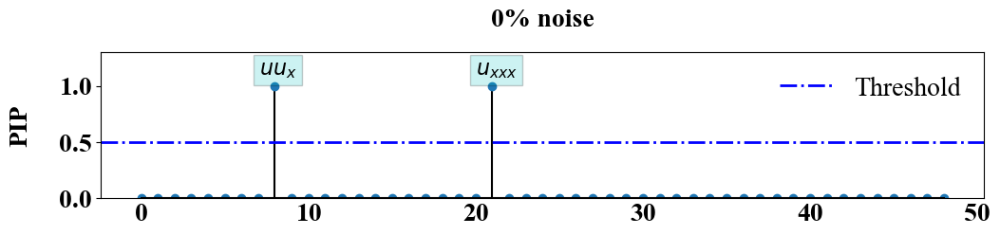

In [13]:
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 20

figure1 = plt.figure(figsize=(12, 2))
xr = np.array(range(nl))

plt.stem(xr, zmean, linefmt='k-', markerfmt='o', basefmt='k-', use_line_collection=True)
plt.axhline(y=0.5, color='b', linestyle='-.', linewidth=2, label='Threshold')

# plt.xlabel('Basis functions (No noise)', fontweight='bold', labelpad=20)
plt.ylabel('PIP', fontweight='bold', labelpad=20)
plt.title('0% noise', fontweight='bold', fontsize=20, pad=20)
plt.grid(False)
plt.ylim(0, 1.3)

plt.xticks(fontweight='bold')
plt.yticks([0, 0.5, 1], fontweight='bold')
plt.yticks(fontweight='bold')
plt.tick_params(axis='x', which='both', length=0)

plt.text(9.3, 1.1, "$uu_{x}$", bbox=dict(facecolor='c', alpha=0.2), fontsize=16, ha='right')
plt.text(20, 1.1, "$u_{xxx}$", bbox=dict(facecolor='c', alpha=0.2), fontsize=16)

plt.legend(loc='upper right', frameon=False, fontsize=20)
plt.show()


# 1% Noise

In [14]:
np.random.seed(0)
Un = U + 0.01*np.std(U)*np.random.randn(n,m)
Utn1, Rn1, rhs_des1 = build_linear_system(Un, dt, dx, D=6, P=6, 
                                 time_diff = 'poly', space_diff = 'poly', 
                                 width_x = 20, width_t = 10, deg_x = 6)

## FIND-SINDy

In [15]:
wn1 = TrainSTRidge(Rn1,Utn1,10**-5,2)
print("PDE derived using STRidge")
print_pde(wn1, rhs_des)

PDE derived using STRidge
u_t = (-6.173902 +0.000000i)uu_{x}
    + (-1.137839 +0.000000i)u_{xxx}
   


In [16]:
print('SINDy L2 (1% noise)  :',np.linalg.norm(True_theta - wn1.reshape(-1))/np.linalg.norm(True_theta) )

SINDy L2 (1% noise)  : 0.036480782526287676


## SINDy

In [17]:
dxdt = np.column_stack(( Utn1 ))
lam = 1
Xi_n1 = sindy(lam,Rn1,dxdt)
print_pde(Xi_n1, rhs_des)

u_t = (1.793662 +0.000000i)u^5
    + (-3.391255 +0.000000i)u^6
    + (-9.987995 +0.000000i)uu_{x}
    + (61.502468 +0.000000i)u^2u_{x}
    + (-181.633095 +0.000000i)u^3u_{x}
    + (-3607.896975 +0.000000i)u^4u_{x}
    + (17694.291599 +0.000000i)u^5u_{x}
    + (-20419.912586 +0.000000i)u^6u_{x}
    + (2.193264 +0.000000i)u^3u_{xx}
    + (-17.472165 +0.000000i)u^6u_{xx}
    + (-52.718137 +0.000000i)uu_{xxx}
    + (839.057239 +0.000000i)u^2u_{xxx}
    + (-6792.403595 +0.000000i)u^3u_{xxx}
    + (23069.226666 +0.000000i)u^4u_{xxx}
    + (-31328.220393 +0.000000i)u^5u_{xxx}
    + (12809.254062 +0.000000i)u^6u_{xxx}
    + (3.576865 +0.000000i)u^3u_{xxxx}
    + (-16.074553 +0.000000i)u^4u_{xxxx}
    + (41.190758 +0.000000i)u^5u_{xxxx}
    + (-47.504294 +0.000000i)u^6u_{xxxx}
    + (-19.967512 +0.000000i)uu_{xxxxx}
    + (378.499499 +0.000000i)u^2u_{xxxxx}
    + (-3202.657450 +0.000000i)u^3u_{xxxxx}
    + (11998.756581 +0.000000i)u^4u_{xxxxx}
    + (-19813.952486 +0.000000i)u^5u_{xxxxx}
    + 

In [18]:
print('SINDy L2 (1% noise)  :',np.linalg.norm(True_theta - Xi_n1.reshape(-1))/np.linalg.norm(True_theta) )

SINDy L2 (1% noise)  : 9232.859271703983


## Variational Bayes

In [19]:
tol = 0.0001
pip = 0.9
verbosity = True
initz0 = initialization(wn1)
xdts = np.reshape(Utn1, -1)
DS = Variational_Bayes_code(Rn1, xdts, initz0, tol, pip, verbosity)
print('zmean  ',  DS['zmean'])
print('model_Index  ',DS['modelIdx'])
print('Wsel  ', DS['Wsel'])
print('Wcov  ', DS['Wcov'])

Iteration = 0  log(Likelihood) = 277487.8733019898
Iteration = 1  log(Likelihood) = 277684.34879742103
Iteration = 2  log(Likelihood) = 277684.3492385483
Iteration = 3  log(Likelihood) = 277684.34923854924
zmean   [1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0]
model_Index   [ 7 20]
Wsel   [-5.90825226 -1.05012922]
Wcov   [3.57972429e-05 4.22143940e-06]


In [20]:
np.sqrt(DS['Wcov'])

array([0.00598308, 0.00205461])

In [21]:
print('Theta :',DS['Wsel'])
vb_theta_n1 = DS['wmean']
vb_theta_n1[0] = 0
zmean1 = DS['zmean']
zmean1[0] = 0
print('VB L2 (1% noise)  :',np.linalg.norm(True_theta - vb_theta_n1.reshape(-1))/np.linalg.norm(True_theta) )

Theta : [-5.90825226 -1.05012922]
VB L2 (1% noise)  : 0.017187822155624245


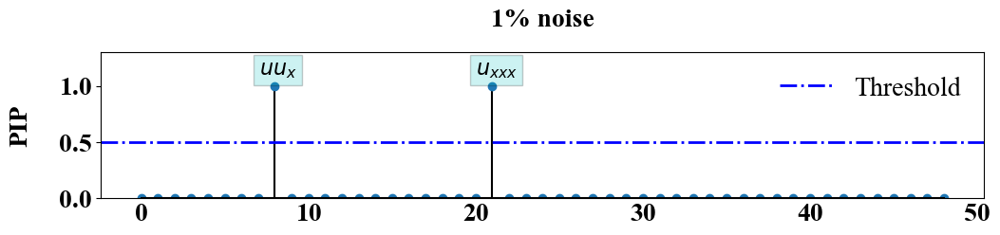

In [22]:
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 20

figure1 = plt.figure(figsize=(12, 2))
xr = np.array(range(nl))

plt.stem(xr, zmean1, linefmt='k-', markerfmt='o', basefmt='k-', use_line_collection=True)
plt.axhline(y=0.5, color='b', linestyle='-.', linewidth=2, label='Threshold')

plt.ylabel('PIP', fontweight='bold', labelpad=20)
plt.title('1% noise', fontweight='bold', fontsize=20, pad=20)
plt.grid(False)
plt.ylim(0, 1.3)

plt.xticks(fontweight='bold')
plt.yticks([0, 0.5, 1], fontweight='bold')
plt.yticks(fontweight='bold')
plt.tick_params(axis='x', which='both', length=0)

plt.text(9.3, 1.1, "$uu_{x}$", bbox=dict(facecolor='c', alpha=0.2), fontsize=16, ha='right')
plt.text(20, 1.1, "$u_{xxx}$", bbox=dict(facecolor='c', alpha=0.2), fontsize=16)

plt.legend(loc='upper right', frameon=False, fontsize=20)
plt.show()


## 2% Noise

In [23]:
np.random.seed(1)
Un2 = U + 0.02*np.std(U)*np.random.randn(n,m)
Utn2, Rn2, rhs_des2 = build_linear_system(Un2, dt, dx, D=6, P=6, 
                                 time_diff = 'poly', space_diff = 'poly', 
                                 width_x = 20, width_t = 20, deg_x = 6)

## FIND-SINDy

In [24]:
wn2 = TrainSTRidge(Rn2,Utn2,0.001,35)
print("PDE derived using STRidge")
print_pde(wn2, rhs_des2)

PDE derived using STRidge
u_t = (-6.009555 +0.000000i)uu_{x}
    + (-1.081494 +0.000000i)u_{xxx}
   


In [25]:
print('FIND-SINDy L2 (2% noise)  :',np.linalg.norm(True_theta - wn2.reshape(-1))/np.linalg.norm(True_theta) )

FIND-SINDy L2 (2% noise)  : 0.013489329646065168


## SINDy

In [26]:
dxdt = np.column_stack(( Utn2 ))
lam = 10
Xi_n2 = sindy(lam,Rn2,dxdt)
print_pde(Xi_n2, rhs_des)

u_t = (-212.893495 +0.000000i)u^2u_{x}
    + (2639.228881 +0.000000i)u^3u_{x}
    + (-17306.832358 +0.000000i)u^4u_{x}
    + (48555.794496 +0.000000i)u^5u_{x}
    + (-45989.881107 +0.000000i)u^6u_{x}
    + (-36.141511 +0.000000i)uu_{xxx}
    + (398.638891 +0.000000i)u^2u_{xxx}
    + (-2488.058779 +0.000000i)u^3u_{xxx}
    + (3085.074007 +0.000000i)u^4u_{xxx}
    + (12142.840677 +0.000000i)u^5u_{xxx}
    + (-22286.720667 +0.000000i)u^6u_{xxx}
    + (-74.139912 +0.000000i)u^2u_{xxxxx}
    + (552.796760 +0.000000i)u^3u_{xxxxx}
    + (-2733.210530 +0.000000i)u^4u_{xxxxx}
    + (7709.581584 +0.000000i)u^5u_{xxxxx}
    + (-7799.147826 +0.000000i)u^6u_{xxxxx}
   


In [27]:
print('SINDy L2 (2% noise)  :',np.linalg.norm(True_theta - Xi_n2.reshape(-1))/np.linalg.norm(True_theta) )

SINDy L2 (2% noise)  : 12266.557910860252


## FIND-SINDy

In [28]:
tol = 0.0001
pip = 0.9
verbosity = True
initz0 = initialization(wn2)
xdts = np.reshape(Utn2, -1)
DS = Variational_Bayes_code(Rn2, xdts, initz0, tol, pip, verbosity)
print('zmean',  DS['zmean']) 
print('wmean',  DS['wmean']) 
print('modelId',  DS['modelIdx']) 
print('Wsel',  DS['Wsel']) 
print('Wcov',  DS['Wcov'])

Iteration = 0  log(Likelihood) = 238236.0965868023
Iteration = 1  log(Likelihood) = 238381.36499959932
Iteration = 2  log(Likelihood) = 238381.36533741566
Iteration = 3  log(Likelihood) = 238381.36533741592
zmean [1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0]
wmean [ 9.78325557e-07  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -5.73339852e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -9.91702415e-01  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+

In [29]:
np.sqrt(DS['Wcov'])

array([0.00691206, 0.00236525])

In [30]:
print('Theta :',DS['Wsel'])
vb_theta_n2 = DS['wmean']
vb_theta_n2[0] = 0
zmean2 = DS['zmean']
zmean2[0] = 0
print('VB L2 (2% noise)  :',np.linalg.norm(True_theta - vb_theta_n2.reshape(-1))/np.linalg.norm(True_theta) )

Theta : [-5.73339852 -0.99170241]
VB L2 (2% noise)  : 0.04385023544053997


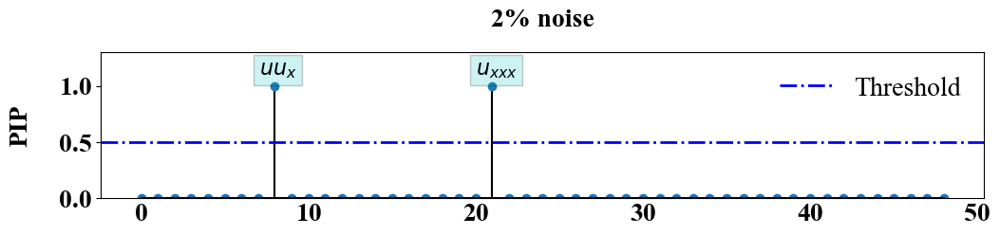

In [31]:
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 20

figure1 = plt.figure(figsize=(12, 2))
xr = np.array(range(nl))

plt.stem(xr, zmean2, linefmt='k-', markerfmt='o', basefmt='k-', use_line_collection=True)
plt.axhline(y=0.5, color='b', linestyle='-.', linewidth=2, label='Threshold')

plt.ylabel('PIP', fontweight='bold', labelpad=20)
plt.title('2% noise', fontweight='bold', fontsize=20, pad=20)
plt.grid(False)
plt.ylim(0, 1.3)

plt.xticks(fontweight='bold')
plt.yticks([0, 0.5, 1], fontweight='bold')
plt.yticks(fontweight='bold')
plt.tick_params(axis='x', which='both', length=0)

plt.text(9.3, 1.1, "$uu_{x}$", bbox=dict(facecolor='c', alpha=0.2), fontsize=16, ha='right')
plt.text(20, 1.1, "$u_{xxx}$", bbox=dict(facecolor='c', alpha=0.2), fontsize=16)

plt.legend(loc='upper right', frameon=False, fontsize=20)
plt.show()


## 5% Noise

In [32]:
np.random.seed(1)
Un5 = U + 0.05*np.std(U)*np.random.randn(n,m)
Utn5, Rn5, rhs_des5 = build_linear_system(Un5, dt, dx, D=6, P=6, 
                                 time_diff = 'poly', space_diff = 'poly', 
                                 width_x = 40, width_t = 30, deg_x = 9)

## FIND-SINDy

In [33]:
wn5 = TrainSTRidge(Rn5,Utn5,0.0001,0.2)
print("PDE derived using STRidge")
print_pde(wn5, rhs_des2)

PDE derived using STRidge
u_t = (-5.615213 +0.000000i)uu_{x}
    + (-0.905727 +0.000000i)u_{xxx}
   


In [34]:
print('FIND-SINDy L2 (5% noise)  :',np.linalg.norm(True_theta - wn5.reshape(-1))/np.linalg.norm(True_theta) )

FIND-SINDy L2 (5% noise)  : 0.06512954893711544


## SINDy

In [35]:
dxdt = np.column_stack(( Utn5 ))
lam = 10
Xi_n5 = sindy(lam,Rn5,dxdt)
print_pde(Xi_n5, rhs_des)

u_t = (-369.907477 +0.000000i)u^2u_{x}
    + (4993.864081 +0.000000i)u^3u_{x}
    + (-25613.441834 +0.000000i)u^4u_{x}
    + (55964.825083 +0.000000i)u^5u_{x}
    + (-43753.648464 +0.000000i)u^6u_{x}
    + (-11.353414 +0.000000i)u^3u_{xx}
    + (96.229012 +0.000000i)u^4u_{xx}
    + (-252.623254 +0.000000i)u^5u_{xx}
    + (213.367260 +0.000000i)u^6u_{xx}
    + (-830.698226 +0.000000i)u^2u_{xxx}
    + (11999.752826 +0.000000i)u^3u_{xxx}
    + (-61168.918905 +0.000000i)u^4u_{xxx}
    + (130739.890099 +0.000000i)u^5u_{xxx}
    + (-99754.420240 +0.000000i)u^6u_{xxx}
    + (-34.208909 +0.000000i)u^3u_{xxxx}
    + (288.809139 +0.000000i)u^4u_{xxxx}
    + (-758.014116 +0.000000i)u^5u_{xxxx}
    + (637.028535 +0.000000i)u^6u_{xxxx}
    + (-241.503936 +0.000000i)u^2u_{xxxxx}
    + (3884.487666 +0.000000i)u^3u_{xxxxx}
    + (-20708.257274 +0.000000i)u^4u_{xxxxx}
    + (45109.525896 +0.000000i)u^5u_{xxxxx}
    + (-34660.041546 +0.000000i)u^6u_{xxxxx}
    + (-16.635160 +0.000000i)u^3u_{xxxxxx}
    

In [36]:
print('SINDy L2 (5% noise)  :',np.linalg.norm(True_theta - Xi_n5.reshape(-1))/np.linalg.norm(True_theta) )

SINDy L2 (5% noise)  : 33018.97749027961


## Variational Bayes

In [37]:
tol = 0.00001
pip = 0.9
verbosity = True
initz0 = initialization(wn5)
xdts = np.reshape(Utn5, -1)
DS = Variational_Bayes_code(Rn5, xdts, initz0, tol, pip, verbosity)
print('zmean',  DS['zmean']) 
print('wmean',  DS['wmean']) 
print('modelId',  DS['modelIdx']) 
print('Wsel',  DS['Wsel']) 
print('Wcov',  DS['Wcov'])

Iteration = 0  log(Likelihood) = 179016.3559086287
Iteration = 1  log(Likelihood) = 179098.6784076208
Iteration = 2  log(Likelihood) = 179098.6786204211
Iteration = 3  log(Likelihood) = 179098.6786204209
OOPS!  log(like) decreasing!!
Iteration = 4  log(Likelihood) = 179098.6786204216
zmean [1 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0]
wmean [-8.17613148e-06  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
 -5.34952886e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -8.23250787e-01  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 

In [38]:
np.sqrt(DS['Wcov'])

array([0.00850708, 0.00283932])

In [39]:
print('Theta :',DS['Wsel'])
vb_theta_n5 = DS['wmean']
vb_theta_n5[0] = 0
zmean5 = DS['zmean']
zmean5[0] = 0
print('VB L2 (5% noise)  :',np.linalg.norm(True_theta - vb_theta_n5.reshape(-1))/np.linalg.norm(True_theta) )

Theta : [-5.34952886 -0.82325079]
VB L2 (5% noise)  : 0.11081430582755711


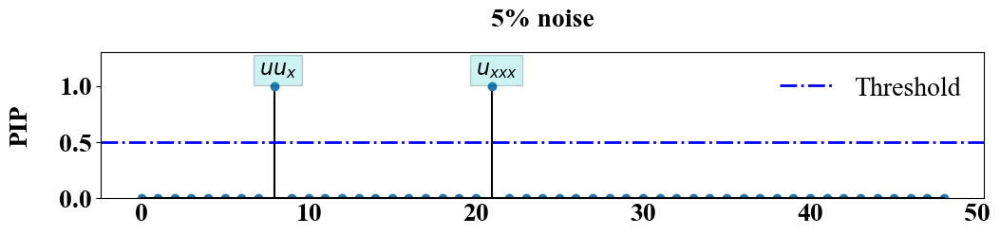

In [40]:
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 20

figure1 = plt.figure(figsize=(12, 2))
xr = np.array(range(nl))

plt.stem(xr, zmean5, linefmt='k-', markerfmt='o', basefmt='k-', use_line_collection=True)
plt.axhline(y=0.5, color='b', linestyle='-.', linewidth=2, label='Threshold')

plt.ylabel('PIP', fontweight='bold', labelpad=20)
plt.title('5% noise', fontweight='bold', fontsize=20, pad=20)
plt.grid(False)
plt.ylim(0, 1.3)

plt.xticks(fontweight='bold')
plt.yticks([0, 0.5, 1], fontweight='bold')
plt.yticks(fontweight='bold')
plt.tick_params(axis='x', which='both', length=0)

plt.text(9.3, 1.1, "$uu_{x}$", bbox=dict(facecolor='c', alpha=0.2), fontsize=16, ha='right')
plt.text(20, 1.1, "$u_{xxx}$", bbox=dict(facecolor='c', alpha=0.2), fontsize=16)

plt.legend(loc='upper right', frameon=False, fontsize=20)
plt.show()


## 10% Noise

In [41]:
np.random.seed(1)
Un10 = U + 0.10*np.std(U)*np.random.randn(n,m)
Utn10, Rn10, rhs_des10 = build_linear_system(Un10, dt, dx, D=6, P=6, 
                                 time_diff = 'poly', space_diff = 'poly', 
                                 width_x = 40, width_t = 30, deg_x = 9)

## FIND-SINDy

In [42]:
wn10 = TrainSTRidge(Rn10,Utn10,0.001,0.1)
print("PDE derived using STRidge")
print_pde(wn10, rhs_des10)

PDE derived using STRidge
u_t = (-0.544890 +0.000000i)u_{x}
    + (-2.330052 +0.000000i)uu_{x}
    + (-0.351305 +0.000000i)u_{xxx}
   


In [43]:
print('FIND-SINDy L2 (10% noise)  :',np.linalg.norm(True_theta - wn10.reshape(-1))/np.linalg.norm(True_theta) )

FIND-SINDy L2 (10% noise)  : 0.6192024073292063


## SINDy

In [44]:
dxdt = np.column_stack(( Utn10 ))
lam = 10
Xi_n10 = sindy(lam,Rn10,dxdt)
print_pde(Xi_n10, rhs_des10)

u_t = (-346.773958 +0.000000i)u^2u_{x}
    + (5051.866891 +0.000000i)u^3u_{x}
    + (-28050.007134 +0.000000i)u^4u_{x}
    + (65547.900194 +0.000000i)u^5u_{x}
    + (-54067.409037 +0.000000i)u^6u_{x}
    + (-27.107569 +0.000000i)u^4u_{xx}
    + (145.701288 +0.000000i)u^5u_{xx}
    + (-184.496108 +0.000000i)u^6u_{xx}
    + (-291.117617 +0.000000i)u^2u_{xxx}
    + (5284.831969 +0.000000i)u^3u_{xxx}
    + (-32306.245859 +0.000000i)u^4u_{xxx}
    + (79223.528857 +0.000000i)u^5u_{xxx}
    + (-67137.587197 +0.000000i)u^6u_{xxx}
    + (-26.397261 +0.000000i)u^3u_{xxxx}
    + (160.959963 +0.000000i)u^4u_{xxxx}
    + (-267.644777 +0.000000i)u^5u_{xxxx}
    + (97.178966 +0.000000i)u^6u_{xxxx}
    + (586.613835 +0.000000i)u^3u_{xxxxx}
    + (-5195.008776 +0.000000i)u^4u_{xxxxx}
    + (14680.198924 +0.000000i)u^5u_{xxxxx}
    + (-13335.895956 +0.000000i)u^6u_{xxxxx}
    + (-13.928624 +0.000000i)u^3u_{xxxxxx}
    + (89.304307 +0.000000i)u^4u_{xxxxxx}
    + (-168.778725 +0.000000i)u^5u_{xxxxxx}
    

In [45]:
print('SINDy L2 (10% noise)  :',np.linalg.norm(True_theta - Xi_n10.reshape(-1))/np.linalg.norm(True_theta) )

SINDy L2 (10% noise)  : 23428.25861190654


## Variational Bayes

In [46]:
tol = 0.00001
pip = 0.9
verbosity = True
initz0 = initialization(wn10)
xdts = np.reshape(Utn10, -1)
DS = Variational_Bayes_code(Rn10, xdts, initz0, tol, pip, verbosity)
print('zmean',  DS['zmean']) 
print('wmean',  DS['wmean']) 
print('modelId',  DS['modelIdx']) 
print('Wsel',  DS['Wsel']) 
print('Wcov',  DS['Wcov'])

Iteration = 0  log(Likelihood) = 190656.96723842283
Iteration = 1  log(Likelihood) = 190801.42144553512
Iteration = 2  log(Likelihood) = 190801.42196656714
Iteration = 3  log(Likelihood) = 190801.42196656766
zmean [1 0 0 0 0 0 0 1 1 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0]
wmean [-1.78922179e-05  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00 -5.85342639e-01
 -2.04461491e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00 -3.00236237e-01  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  0.00000000e+00  0.00000000e

In [47]:
np.sqrt(DS['Wcov'])

array([0.00206315, 0.0116313 , 0.0023615 ])

In [48]:
print('Theta :',DS['Wsel'])
vb_theta_n10 = DS['wmean']
vb_theta_n10[0] = 0
zmean10 = DS['zmean']
zmean10[0] = 0
print('VB L2 (5% noise)  :',np.linalg.norm(True_theta - vb_theta_n10.reshape(-1))/np.linalg.norm(True_theta) )

Theta : [-0.58534264 -2.04461491 -0.30023624]
VB L2 (5% noise)  : 0.6673336730933472


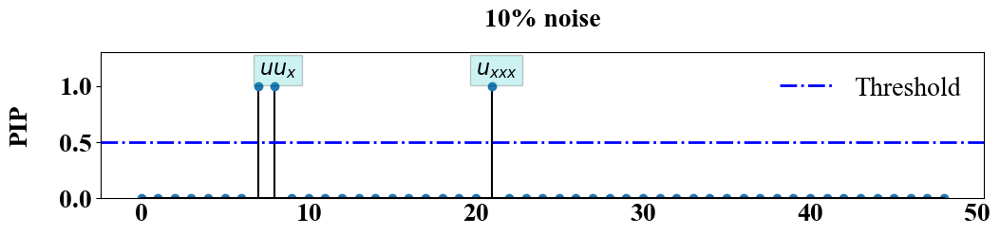

In [49]:
plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 20

figure1 = plt.figure(figsize=(12, 2))
xr = np.array(range(nl))

plt.stem(xr, zmean10, linefmt='k-', markerfmt='o', basefmt='k-', use_line_collection=True)
plt.axhline(y=0.5, color='b', linestyle='-.', linewidth=2, label='Threshold')

plt.ylabel('PIP', fontweight='bold', labelpad=20)
plt.title('10% noise', fontweight='bold', fontsize=20, pad=20)
plt.grid(False)
plt.ylim(0, 1.3)

plt.xticks(fontweight='bold')
plt.yticks([0, 0.5, 1], fontweight='bold')
plt.yticks(fontweight='bold')
plt.tick_params(axis='x', which='both', length=0)

plt.text(9.3, 1.1, "$uu_{x}$", bbox=dict(facecolor='c', alpha=0.2), fontsize=16, ha='right')
plt.text(20, 1.1, "$u_{xxx}$", bbox=dict(facecolor='c', alpha=0.2), fontsize=16)

plt.legend(loc='upper right', frameon=False, fontsize=20)
plt.show()


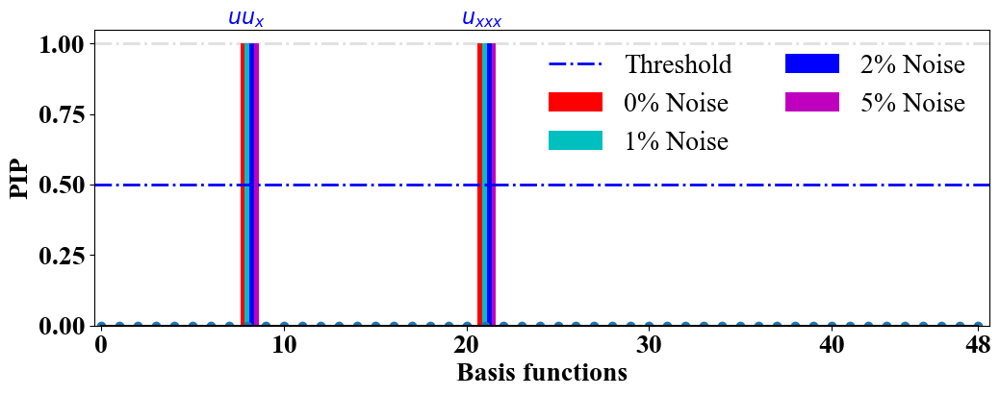

In [50]:
fig = plt.figure(figsize=(12,4))
plt.stem(xr, zmean5*0, linefmt='k-', markerfmt='o', basefmt='k-', use_line_collection=True)
plt.bar(xr - 0.25, zmean, color = 'r', width = 0.25, label='0% Noise')
plt.bar(xr + 0.0, zmean1, color = 'c', width = 0.25, label='1% Noise')
plt.bar(xr + 0.25, zmean2, color = 'b', width = 0.25, label='2% Noise')
plt.bar(xr + 0.50, zmean5, color = 'm', width = 0.25, label='5% Noise')
plt.axhline(y=0.5, color='b', linestyle='-.', linewidth=2, label='Threshold')
plt.axhline(y=1.0, color='grey', linestyle='-.', alpha=0.25, linewidth=2)

plt.xlabel('Basis functions', fontweight='bold')
plt.ylabel('PIP', fontweight='bold')
plt.grid(False)
plt.ylim(0, 1.05)

plt.xticks([0, 10, 20, 30, 40, 48], fontweight='bold')
plt.yticks([0, 0.25, 0.5, 0.75, 1], fontweight='bold')
plt.yticks(fontweight='bold')
plt.tick_params(axis='x', which='both')
plt.margins(0)

plt.text(9, 1.07, "$uu_{x}$", color='blue', fontsize=16, ha='right')
plt.text(22, 1.07, "$u_{xxx}$", color='blue', fontsize=16, ha='right')

plt.legend(loc='upper right', ncol=2, frameon=False, fontsize=20)

plt.show()
fig.savefig('images/1D_KDV_combined.pdf',format='pdf',dpi=600,bbox_inches='tight')

In [51]:
from IPython.display import HTML
import matplotlib.animation as animation

import matplotlib.pyplot as plt

from tqdm import tqdm
def initial_condition(x: np.array, v: float, x0: float, equation_form: str):
    """ Function creating initial conditions for given data.
    Args:
        x: vector of x values
        v: coefficient (???)
        equation_form (str): form of KdV equation. Choose from 'standard' and 'zk'
    """
    if equation_form == 'standard':
        a = np.cosh(0.5 * np.sqrt(v) * (x - x0))
        return v / (2 * np.multiply(a, a))
    elif equation_form == 'wikipedia_example':
        return np.cos(np.pi * x)
    else:
        raise ValueError("Invalid equation form.")
        
def coeff_at_ux(x, ux1, ux3, coeff):
    """ Function returning form of KdV equation with coefficient next to ux. 
    Args:
        x: x
        ux1: dU / dX
        ux3: d^3 U / d X^3
        coeff: const
    """
    return -coeff * x * ux1 - ux3

def coeff_at_uxxx(x, ux1, ux3, delta):
    """ Function returning form of KdV equation with coefficient next to uxxx. 
    Args:
        x: x
        ux1: dU / dX
        ux3: d^3 U / d X^3
        delta: const
    """
    return -x * ux1 - delta**2 * ux3

def U1(u0: np.array, dx: float, dt: float, coeff: float, coeff_placement: str, accuracy: int = 2):
    """Function calculating first step of the solution.
    Args:
        u0: initial condition: u(x, 0)
        dx: space step
        dt: time step
        coeff: coefficient
        coeff_placement: where coefficient stands
        accuracy: finite differences argument
    Returns:
        np.array: solution for first time step.
    """
    # periodic boundary conditions!
    up1 = np.hstack([u0[1:], u0[:1]])
    up2 = np.hstack([u0[2:], u0[:2]])
    up3 = np.hstack([u0[3:], u0[:3]])
    up4 = np.hstack([u0[4:], u0[:4]])
    u = np.array(u0)
    um1 = np.hstack([u0[-1:], u0[:-1]])
    um2 = np.hstack([u0[-2:], u0[:-2]])
    um3 = np.hstack([u0[-3:], u0[:-3]])
    um4 = np.hstack([u0[-4:], u0[:-4]])
    
    if accuracy == 2:
        # O(h^2) Central differences
        ux1 = (up1 - um1) / (2 * dx)
        ux3 = (up2 - 2 * up1 + 2 * um1 - um2) / (2 * dx * dx * dx)
        
    elif accuracy == 4:
        # O(h^4) Central differences
        ux1 = (-(up2 - um2) + 8 * (up1 - um1)) / (12 * dx)
        ux3 = (-(up3 - um3) + 8 * (up2 - um2) - 13 * (up1 - um1)) / (8 * dx * dx * dx)
    
    elif accuracy == 6:
        #O(h^6) Central differences
        ux1 = ((up3 - um3) - 9 * (up2 - um2) + 45 * (up1 - um1)) / (60 * dx)
        ux3 = (7 * (up4 - um4) - 72 * (up3 - um3) + 338 * (up2 - um2) - 488 * (up1 - um1)) / (240 * dx * dx * dx)
    
    uc = (up1 + u + um1) / 3

    if coeff_placement == 'ux':
        return u0 - coeff * dt * np.multiply(uc, ux1) - dt * ux3
    
    elif coeff_placement == 'uxxx':
        return u0 - dt * np.multiply(uc, ux1) - coeff**2 * dt * ux3
    
    
def U2(u0: np.array, u1: np.array, dx: float, dt: float, coeff: float, coeff_placement: str, accuracy: int = 2):
    """Function calculating next steps of the solution.
    Args:
        u0: value of u two time steps before - u(x, t - 2*dt)
        u1: value of u one time step before - u(x, t - dt)
        dx: space step
        dt: time step
        coeff: coefficient
        coeff_placement: where coefficient stands
        accuracy: finite differences argument
    Returns:
        np.array: solution for current time moment.
    """
    
    up1 = np.hstack([u1[1:], u1[:1]])
    up2 = np.hstack([u1[2:], u1[:2]])
    up3 = np.hstack([u1[3:], u1[:3]])
    up4 = np.hstack([u1[4:], u1[:4]])
    u = np.array(u1)
    um1 = np.hstack([u1[-1:], u1[:-1]])
    um2 = np.hstack([u1[-2:], u1[:-2]])
    um3 = np.hstack([u1[-3:], u1[:-3]])
    um4 = np.hstack([u1[-4:], u1[:-4]])
    
    if accuracy == 2:
        # O(h^2) Central differences
        ux1 = (up1 - um1) / (2 * dx)
        ux3 = (up2 - 2 * up1 + 2 * um1 - um2) / (2 * dx * dx * dx)
        
    elif accuracy == 4:
        # O(h^4) Central differences
        ux1 = (-(up2 - um2) + 8 * (up1 - um1)) / (12 * dx)
        ux3 = (-(up3 - um3) + 8 * (up2 - um2) - 13 * (up1 - um1)) / (8 * dx * dx * dx)
    
    elif accuracy == 6:
        #O(h^6) Central differences
        ux1 = ((up3 - um3) - 9 * (up2 - um2) + 45 * (up1 - um1)) / (60 * dx)
        ux3 = (7 * (up4 - um4) - 72 * (up3 - um3) + 338 * (up2 - um2) - 488 * (up1 - um1)) / (240 * dx * dx * dx)
    
    uc = (up1 + u + um1) / 3

    if coeff_placement == 'ux':
        return u0 - 2 * coeff * dt * np.multiply(uc, ux1) - 2 * dt * ux3
    
    elif coeff_placement == 'uxxx':
        return u0 - 2 * dt * np.multiply(uc, ux1) - 2 * coeff**2 * dt * ux3
    
    
def visualise(u_prev: list, u_curr: list, zk_params: dict, ylim: tuple = (-2,12), xlim: tuple = (-8,8),
              anim_interval: int = 20, steps: int = 50):
    """ visualisation tool for KdV equation with given x, y (initial condition)
        and params forZabusky-Kruskal method. 
    """

    fig, ax = plt.subplots();
    line, = ax.plot([], [])
    ax.set_ylim(ylim)
    ax.set_xlim(xlim)
    def init():
        line.set_data([], [])

    def animate(i):
        global u_curr
        global u_prev
        global U
        for i in range(steps):
            # U = U2(u_prev, u_curr, dx, dt, 6, "ux")
            U = U2(u_prev, u_curr, **zk_params)
            u_prev = u_curr
            u_curr = U
        line.set_data(x, U)

    anim = animation.FuncAnimation(fig, animate, init_func=init, frames=400, interval = anim_interval, repeat=False) 
    plt.close()

    return HTML(anim.to_jshtml())

In [52]:
# two solitons
dx = 0.1
dt = 1e-5
x = np.arange(-8, 10, dx)

# first solition
initial_condition_params = {'v': 16,'x0': 0,'equation_form': 'standard'}

# second solition
initial_condition2_params = {'v': 4,'x0': 4,'equation_form': 'standard'}

zabusky_kruskal_params = {'dx': dx,'dt': dt,'coeff': 6,'coeff_placement': 'ux','accuracy': 6}

# Let's build 2 solitons and execture first iteration
u_prev = initial_condition(x, **initial_condition_params) + initial_condition(x, **initial_condition2_params)

u_curr = U1(u_prev, **zabusky_kruskal_params)

# Let's iterate over next iterations.

visualise(u_prev, u_curr, zabusky_kruskal_params, ylim = [-2, 12], xlim=[-8, 10], anim_interval=30, steps=150)

In [53]:
def SOLUTION_GEN(steps):
    zk_params = {'dx': dx,'dt': dt,'coeff': 6,'coeff_placement': 'ux','accuracy': 6}
    global u_curr
    global u_prev
    global U
    ans = [u_prev, u_curr]
    for i in range(steps):
        U = U2(u_prev, u_curr, **zk_params)
        ans.append(U)
        u_prev = u_curr
        u_curr = U
        
    return ans

UN = np.array(SOLUTION_GEN(steps=150))

In [54]:
def U1(u0: np.array, dx: float, dt: float, coeff: float, coeff_placement: str, coeff_2: float, accuracy: int = 2):
    """Function calculating first step of the solution.
    Args:
        u0: initial condition: u(x, 0)
        dx: space step
        dt: time step
        coeff: coefficient
        coeff_placement: where coefficient stands
        accuracy: finite differences argument
    Returns:
        np.array: solution for first time step.
    """
    # periodic boundary conditions!
    up1 = np.hstack([u0[1:], u0[:1]])
    up2 = np.hstack([u0[2:], u0[:2]])
    up3 = np.hstack([u0[3:], u0[:3]])
    up4 = np.hstack([u0[4:], u0[:4]])
    u = np.array(u0)
    um1 = np.hstack([u0[-1:], u0[:-1]])
    um2 = np.hstack([u0[-2:], u0[:-2]])
    um3 = np.hstack([u0[-3:], u0[:-3]])
    um4 = np.hstack([u0[-4:], u0[:-4]])
    
    if accuracy == 2:
        # O(h^2) Central differences
        ux1 = (up1 - um1) / (2 * dx)
        ux3 = (up2 - 2 * up1 + 2 * um1 - um2) / (2 * dx * dx * dx)
        
    elif accuracy == 4:
        # O(h^4) Central differences
        ux1 = (-(up2 - um2) + 8 * (up1 - um1)) / (12 * dx)
        ux3 = (-(up3 - um3) + 8 * (up2 - um2) - 13 * (up1 - um1)) / (8 * dx * dx * dx)
    
    elif accuracy == 6:
        #O(h^6) Central differences
        ux1 = ((up3 - um3) - 9 * (up2 - um2) + 45 * (up1 - um1)) / (60 * dx)
        ux3 = (7 * (up4 - um4) - 72 * (up3 - um3) + 338 * (up2 - um2) - 488 * (up1 - um1)) / (240 * dx * dx * dx)
    
    uc = (up1 + u + um1) / 3

    if coeff_placement == 'ux':
        return u0 - coeff * dt * np.multiply(uc, ux1) - dt * ux3
    
    elif coeff_placement == 'uxxx':
        return u0 - coeff_2 * dt * np.multiply(uc, ux1) - coeff**2 * dt * ux3

def U2(u0: np.array, u1: np.array, dx: float, dt: float, coeff: float, coeff_placement: str, coeff_2: float, accuracy: int = 2):
    """Function calculating next steps of the solution.
    Args:
        u0: value of u two time steps before - u(x, t - 2*dt)
        u1: value of u one time step before - u(x, t - dt)
        dx: space step
        dt: time step
        coeff: coefficient
        coeff_placement: where coefficient stands
        accuracy: finite differences argument
    Returns:
        np.array: solution for current time moment.
    """
    
    up1 = np.hstack([u1[1:], u1[:1]])
    up2 = np.hstack([u1[2:], u1[:2]])
    up3 = np.hstack([u1[3:], u1[:3]])
    up4 = np.hstack([u1[4:], u1[:4]])
    u = np.array(u1)
    um1 = np.hstack([u1[-1:], u1[:-1]])
    um2 = np.hstack([u1[-2:], u1[:-2]])
    um3 = np.hstack([u1[-3:], u1[:-3]])
    um4 = np.hstack([u1[-4:], u1[:-4]])
    
    if accuracy == 2:
        # O(h^2) Central differences
        ux1 = (up1 - um1) / (2 * dx)
        ux3 = (up2 - 2 * up1 + 2 * um1 - um2) / (2 * dx * dx * dx)
        
    elif accuracy == 4:
        # O(h^4) Central differences
        ux1 = (-(up2 - um2) + 8 * (up1 - um1)) / (12 * dx)
        ux3 = (-(up3 - um3) + 8 * (up2 - um2) - 13 * (up1 - um1)) / (8 * dx * dx * dx)
    
    elif accuracy == 6:
        #O(h^6) Central differences
        ux1 = ((up3 - um3) - 9 * (up2 - um2) + 45 * (up1 - um1)) / (60 * dx)
        ux3 = (7 * (up4 - um4) - 72 * (up3 - um3) + 338 * (up2 - um2) - 488 * (up1 - um1)) / (240 * dx * dx * dx)
    
    uc = (up1 + u + um1) / 3

    if coeff_placement == 'ux':
        return u0 - 2 * coeff * dt * np.multiply(uc, ux1) - 2 * dt * ux3
    
    elif coeff_placement == 'uxxx':
        return u0 - 2 * coeff_2 * dt * np.multiply(uc, ux1) - 2 * coeff**2 * dt * ux3

In [55]:
# two solitons
dx = 0.1
dt = 1e-5
x = np.arange(-8, 10, dx)

# first solition
initial_condition_params = {
    'v': 16,
    'x0': 0,
    'equation_form': 'standard'
}

# second solition
initial_condition2_params = {
    'v': 4,
    'x0': 4,
    'equation_form': 'standard'
}
coeff_1 =6
coeff_2 =1
coeff_placement = 'ux'
accuracy = 6
# Let's build 2 solitons and execture first iteration
u_prev = initial_condition(x, **initial_condition_params) + initial_condition(x, **initial_condition2_params)

u_curr = U1(u_prev, dx, dt, coeff_1, coeff_placement, coeff_2, accuracy)
steps = 150
ans = [u_prev, u_curr]
for i in range(steps):
    U = U2(u_prev, u_curr, dx, dt, coeff_1, coeff_placement, coeff_2, accuracy)
    ans.append(U)
    u_prev = u_curr
    u_curr = U
UN = np.array(ans)

In [56]:
def PREDICTION(coeff_1, coeff_2):
    # two solitons

    dx = 0.1
    dt = 1e-5
    x = np.arange(-8, 10, dx)

    # first solition
    initial_condition_params = {'v': 16,'x0': 0,'equation_form': 'standard'}

    # second solition
    initial_condition2_params = {'v': 4,'x0': 4,'equation_form': 'standard'}
    coeff_placement = 'ux'
    accuracy = 6
    # Let's build 2 solitons and execture first iteration
    u_prev = initial_condition(x, **initial_condition_params) + initial_condition(x, **initial_condition2_params)

    u_curr = U1(u_prev, dx, dt, coeff_1, coeff_placement, coeff_2, accuracy)
    steps = 150
    ans = [u_prev, u_curr]
    for i in range(steps):
        U = U2(u_prev, u_curr, dx, dt, coeff_1, coeff_placement, coeff_2, accuracy)
        ans.append(U)
        u_prev = u_curr
        u_curr = U
    return ans

In [57]:
mean1 = 5.908
std1 = 0.005983
mean2 = 1.05
std2 =  0.002054
MCMC = 100
pred_arr = []

for i in range (MCMC):
    theta1 = np.random.normal(loc = mean1, scale = std1)
    theta2 = np.random.normal(loc = mean2, scale = std2)
    pred_arr.append(PREDICTION(theta1, theta2))
    
pred_arr = np.array(pred_arr)
UN_pred = PREDICTION(mean1, mean2)
mu_pred = np.mean(pred_arr, axis=0)
std_pred = np.std(pred_arr, axis=0)
up = mu_pred + 2*std_pred
down = mu_pred - 2*std_pred

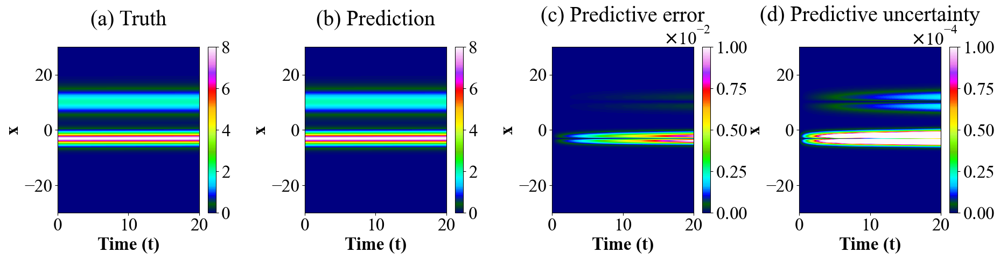

In [58]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
x = np.linspace(0,20 , 152)
y = np.linspace(-30, 30, 180)

plt.rcParams['font.family'] = 'Times New Roman'
plt.rcParams['font.size'] = 24
plt.rcParams['mathtext.fontset'] = 'dejavuserif'

fig1 = plt.figure(figsize=(22,4))
fig1.subplots_adjust(wspace=0.4)

plt.subplot(1,4,1)
contour = plt.imshow(UN.T, cmap='gist_ncar', extent=[0,20,-30,30], aspect='auto', origin='lower',
                    vmin=0, vmax=8)
plt.xlabel('Time (t)', fontweight='bold')  # Increase the font size and adjust the labelpad
plt.ylabel('x', fontweight='bold')  # Increase the font size and adjust the labelpad
plt.title('(a) Truth', pad=30)
colorbar = plt.colorbar(contour, orientation="vertical")
colorbar.formatter.set_powerlimits((-4, 4))
colorbar.update_ticks()
plt.tick_params(axis='both', which='major')

plt.subplot(1,4,2)
contour = plt.imshow(mu_pred.T, cmap='gist_ncar', extent=[0,20,-30,30], aspect='auto', origin='lower',
                    vmin=0, vmax=8)
plt.xlabel('Time (t)', fontweight='bold')  # Increase the font size and adjust the labelpad
plt.ylabel('x', fontweight='bold')  # Increase the font size and adjust the labelpad
plt.title('(b) Prediction', pad=30)
colorbar = plt.colorbar(contour, orientation="vertical")
colorbar.formatter.set_powerlimits((-4, 4))
colorbar.update_ticks()
plt.tick_params(axis='both', which='major')

plt.subplot(1,4,3)
contour = plt.imshow(np.abs(mu_pred-UN).T, extent=[0,20,-30,30], cmap='gist_ncar', aspect='auto', origin='lower',
                     vmin=0, vmax=0.01)
plt.xlabel('Time (t)', fontweight='bold')  # Increase the font size and adjust the labelpad
plt.ylabel('x', fontweight='bold')  # Increase the font size and adjust the labelpad
plt.title('(c) Predictive error', pad=35)
colorbar = plt.colorbar(contour, orientation="vertical")
colorbar.formatter.set_powerlimits((0, 0))
colorbar.formatter.set_useMathText(True)
colorbar.update_ticks()
plt.tick_params(axis='both', which='major')

plt.subplot(1,4,4)
contour = plt.imshow(std_pred.T, cmap='gist_ncar', extent=[0,20,-30,30], aspect='auto', origin='lower',
                    vmin=0, vmax=0.0001)
plt.xlabel('Time (t)', fontweight='bold')  # Increase the font size and adjust the labelpad
plt.ylabel('x', fontweight='bold')  # Increase the font size and adjust the labelpad
plt.title('(d) Predictive uncertainty', pad=35)
colorbar = plt.colorbar(contour, orientation="vertical")
colorbar.formatter.set_powerlimits((0, 0))
colorbar.formatter.set_useMathText(True)
colorbar.update_ticks()
plt.tick_params(axis='both', which='major')
plt.show()

fig1.savefig('images/Prediction_Kdv.pdf', format='pdf', dpi=600, bbox_inches='tight')